# Change detection using 2D images from the ARGUS tower on the Sand Engine

This notebook provides the code used in performing the change detection algorithms in our research. The code works based on the original name of the ARGUS imagery and the images are stored in the time_series folder.

The first part of the notebook consists of the change detection algorithm, and the second part consists of the code used to find the shift of the image using feature tracking.

In [2]:
#Installing the necessary packages

!pip install pillow

import os
from PIL import Image
from datetime import datetime
import matplotlib.pyplot as plt
import re
import numpy as np
from sklearn.decomposition import PCA
from skimage.io import imread
import matplotlib.patches as patches
from scipy.ndimage import shift

#Map with the ARGUS images
image_folder = "./ARGUS_time_series"
image_files = sorted([f for f in os.listdir(image_folder) if f.endswith('.timex.jpg')])

# Part 1: Change detection

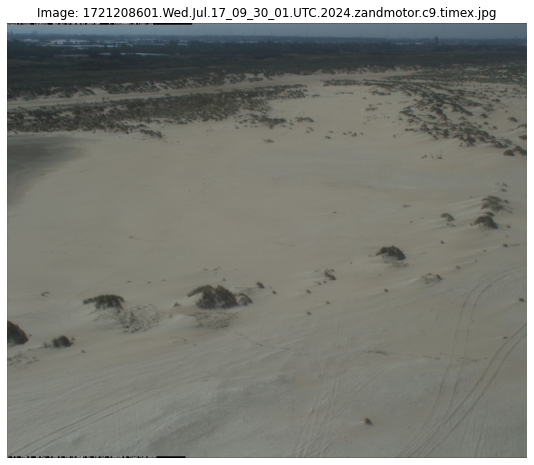

Image size (width, height): (2448, 2048)
Date and time: 2024-07-17 09:30


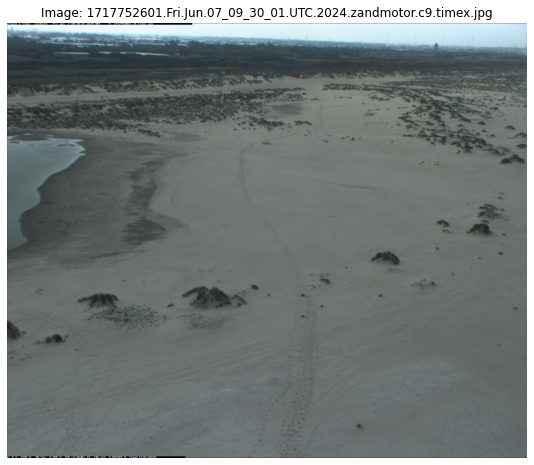

Image size (width, height): (2448, 2048)
Date and time: 2024-06-07 09:30


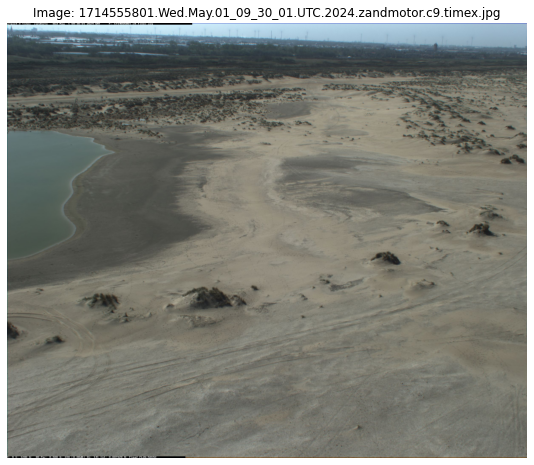

Image size (width, height): (2448, 2048)
Date and time: 2024-05-01 09:30


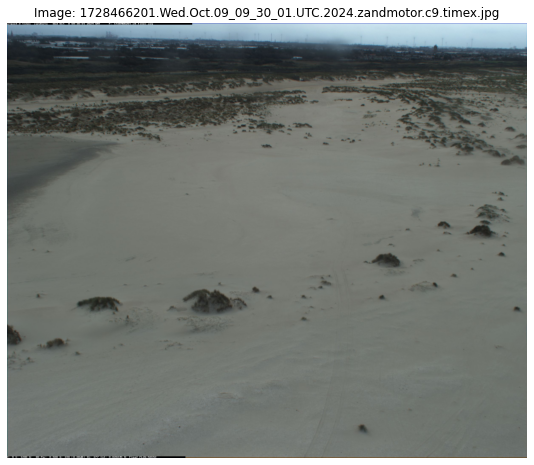

Image size (width, height): (2448, 2048)
Date and time: 2024-10-09 09:30


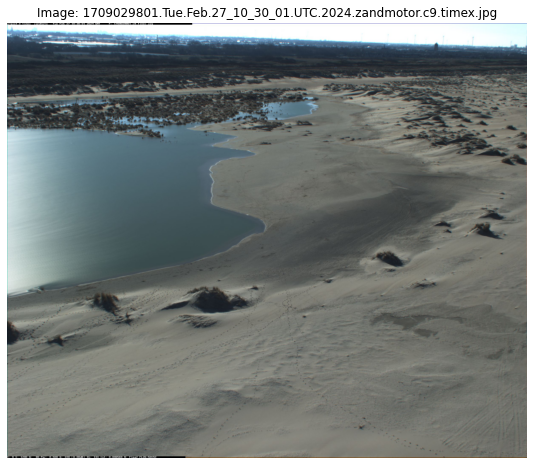

Image size (width, height): (2448, 2048)
Date and time: 2024-02-27 10:30


In [3]:
def process_image(image_path):
    filename = os.path.basename(image_path)
    
    with Image.open(image_path) as img:

        plt.figure(figsize=(14,8))
        plt.imshow(img)
        plt.title(f"Image: {filename}")
        plt.axis('off')  
        plt.show()

        print(f"Image size (width, height): {img.size}")

    parts = filename.split('.')
    
    #Extract the date from the file name
    month, year, time = parts[2], parts[5], parts[3]

    day, hour, minute = time[0:2], time[3:5], time[6:8]

    formatted_date_time = datetime.strptime(f'{day} {month} {year} {hour} {minute}', "%d %b %Y %H %M")
    
    print(f"Date and time: {formatted_date_time.strftime('%Y-%m-%d %H:%M')}")

for image_file in os.listdir(image_folder):
    if image_file.endswith('.timex.jpg'):
        image_path = os.path.join(image_folder, image_file)
        process_image(image_path)

## Change detection using differencing and a threshold

Comparing 1709029801.Tue.Feb.27_10_30_01.UTC.2024.zandmotor.c9.timex.jpg with 1714555801.Wed.May.01_09_30_01.UTC.2024.zandmotor.c9.timex.jpg


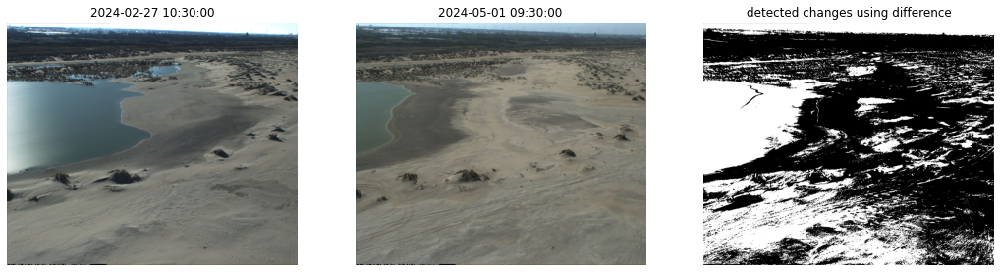

Comparing 1714555801.Wed.May.01_09_30_01.UTC.2024.zandmotor.c9.timex.jpg with 1717752601.Fri.Jun.07_09_30_01.UTC.2024.zandmotor.c9.timex.jpg


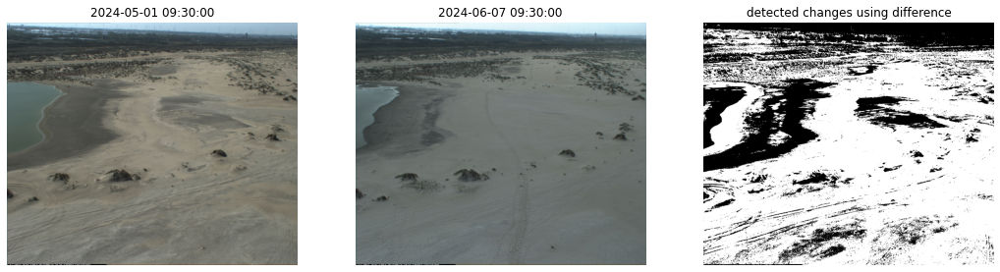

Comparing 1717752601.Fri.Jun.07_09_30_01.UTC.2024.zandmotor.c9.timex.jpg with 1721208601.Wed.Jul.17_09_30_01.UTC.2024.zandmotor.c9.timex.jpg


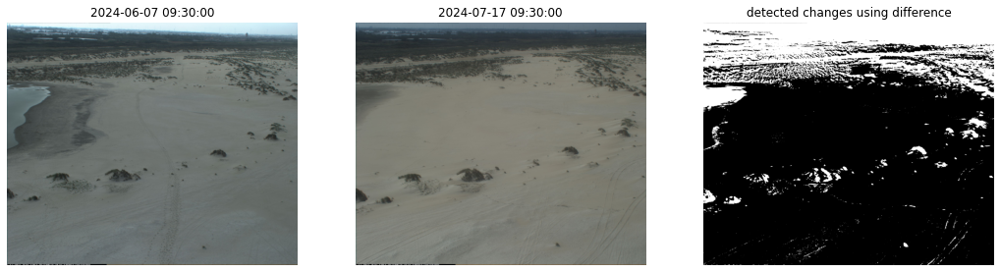

Comparing 1721208601.Wed.Jul.17_09_30_01.UTC.2024.zandmotor.c9.timex.jpg with 1728466201.Wed.Oct.09_09_30_01.UTC.2024.zandmotor.c9.timex.jpg


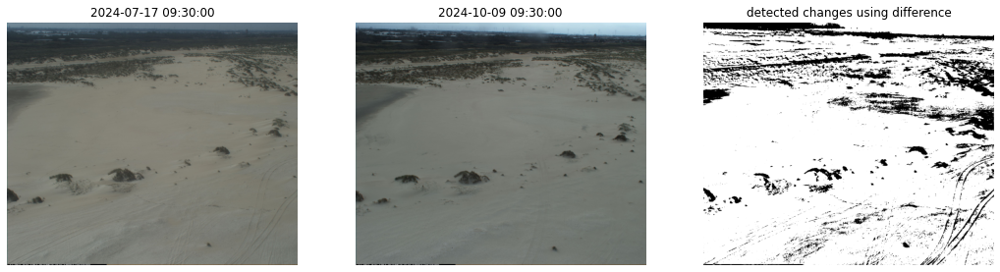

In [4]:
def load_and_preprocess(image_path):
    
    """Load an image and preprocess it (convert to grayscale)."""
    
    with Image.open(image_path) as img:
        img_rgb = img
        img_gray = img.convert("L")  
        
    filename = os.path.basename(image_path)
    
    parts = filename.split('.')

    month, year, time = parts[2], parts[5], parts[3]
    day, hour, minute = time[0:2], time[3:5], time[6:8]
    
    formatted_date_time = datetime.strptime(f'{day} {month} {year} {hour} {minute}', "%d %b %Y %H %M")

    return np.array(img_gray), formatted_date_time, img_rgb

def differences(image1_path, image2_path):
    
    """Process two images, subtract, and display differences."""
    
    img1, img1_name, img1_rgb = load_and_preprocess(image1_path)
    img2, img2_name, img2_rgb = load_and_preprocess(image2_path)

    #Subtract images
    diff = np.abs(img2 - img1)
    
    #Use a threshold
    threshold = 65
    diff_thresh = (diff > threshold) * 255  
    
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img1_rgb)
    plt.title(f'{img1_name}')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(img2_rgb)
    plt.title(f'{img2_name}')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(diff_thresh, cmap='gray')
    plt.title("detected changes using difference")
    plt.axis('off')

    plt.show()

for i in range(1, len(image_files)):
    image1_path = os.path.join(image_folder, image_files[i-1])
    image2_path = os.path.join(image_folder, image_files[i])
    print(f"Comparing {image_files[i-1]} with {image_files[i]}")
    differences(image1_path, image2_path)  

## Change detection using PCA

Comparing 2024-02-27 10:30:00 with 2024-05-01 09:30:00


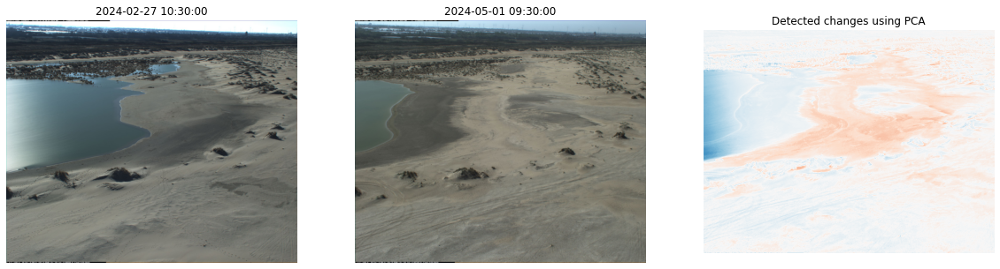

Comparing 2024-05-01 09:30:00 with 2024-06-07 09:30:00


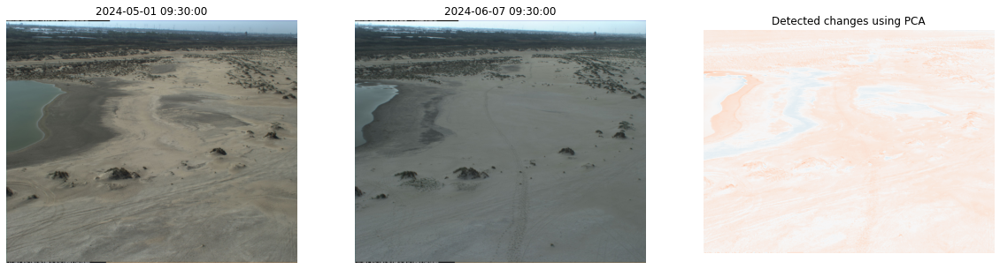

Comparing 2024-06-07 09:30:00 with 2024-07-17 09:30:00


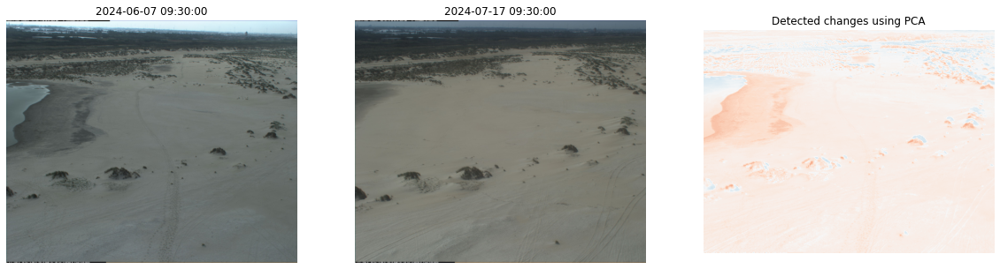

Comparing 2024-07-17 09:30:00 with 2024-10-09 09:30:00


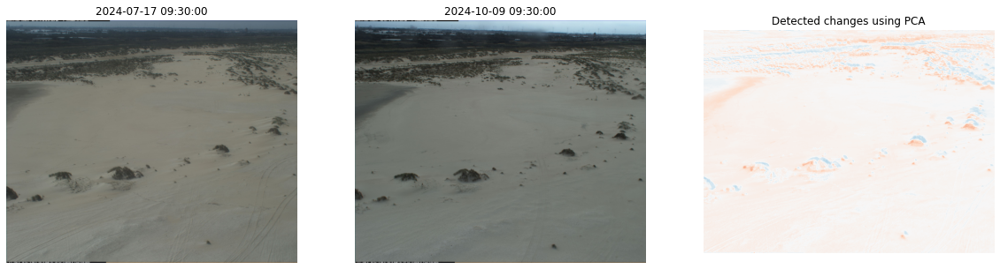

In [5]:
def load_and_standardize(image_path):
    
    """Load and preprocess image, then standardize.""" 
    
    with Image.open(image_path) as img:
        normal_img = img
        img_gray = img.convert("L")
        img_array = np.array(img_gray, dtype=np.float32)
        
        #remove sky
        crop_height = int(img_array.shape[0] * 0.08)
        img_cropped = img_array[crop_height:, :]
        
        normalized_img = (img_cropped - img_cropped.mean()) / (img_cropped.std() + 1e-5)

        
        filename = os.path.basename(image_path)

        parts = filename.split('.')
        month, year, time = parts[2], parts[5], parts[3]
        day, hour, minute = time[0:2], time[3:5], time[6:8]
        
        formatted_date_time = datetime.strptime(f'{day} {month} {year} {hour} {minute}', "%d %b %Y %H %M")
        
        return normalized_img, formatted_date_time, normal_img, formatted_date_time


def apply_pca(img1, img2):
    
    """Apply PCA by stacking the images and taking the second PCA component""" 
    
    img_stack = np.stack((img1, img2), axis=2)

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(img_stack.reshape(-1, 2))

    pca_img = pca_result[:, 1].reshape(img1.shape)

    return pca_img

def change_detection(image1_path, image2_path):
    img1, date1, normal_img1 = load_and_standardize(image1_path)[0:3]
    img2, date2, normal_img2 = load_and_standardize(image2_path)[0:3]

    #Note: use np.abs(apply_pca(img1,img2)) to only show absolute differences
    pca_diff = apply_pca(img1, img2)

    plt.figure(figsize=(20,8))
    
    plt.subplot(1, 3, 1)
    plt.imshow(normal_img1)
    plt.title(f"{date1}")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(normal_img2)
    plt.title(f"{date2}")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(pca_diff, cmap='RdBu')
    plt.title('Detected changes using PCA')
    plt.axis('off')
    plt.savefig(f'{date2}comp_PCA.png')
    plt.show()

for i in range(1, len(image_files)):
    image1_path = os.path.join(image_folder, image_files[i-1])
    image2_path = os.path.join(image_folder, image_files[i])
    print(f"Comparing {load_and_standardize(image1_path)[1]} with {load_and_standardize(image2_path)[1]}")
    change_detection(image1_path, image2_path)

Comparing 2024-02-27 10:30:00 with 2024-10-09 09:30:00


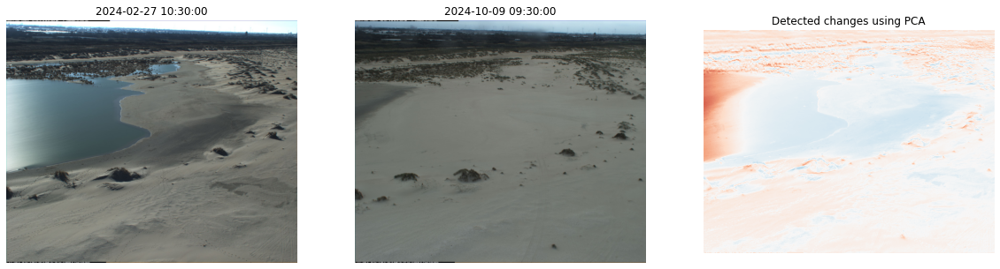

In [6]:
#detected changes for the earliest image and the latest

earliest = os.path.join(image_folder, image_files[0]) 
latest = os.path.join(image_folder, image_files[-1])

print(f"Comparing {load_and_standardize(earliest)[1]} with {load_and_standardize(latest)[1]}")

change_detection(earliest, latest)

# Part 2: Shrub tracking using correlation

Calculating displacement between 2024-02-27 10:30:00 and 2024-05-01 09:30:00


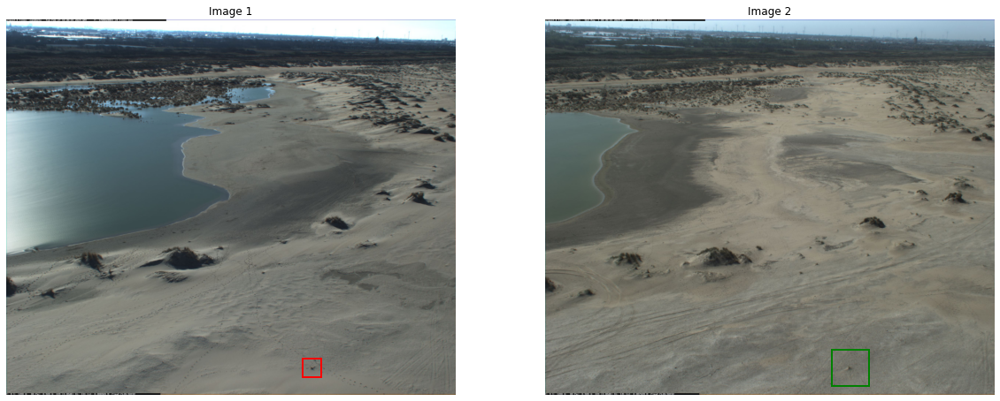

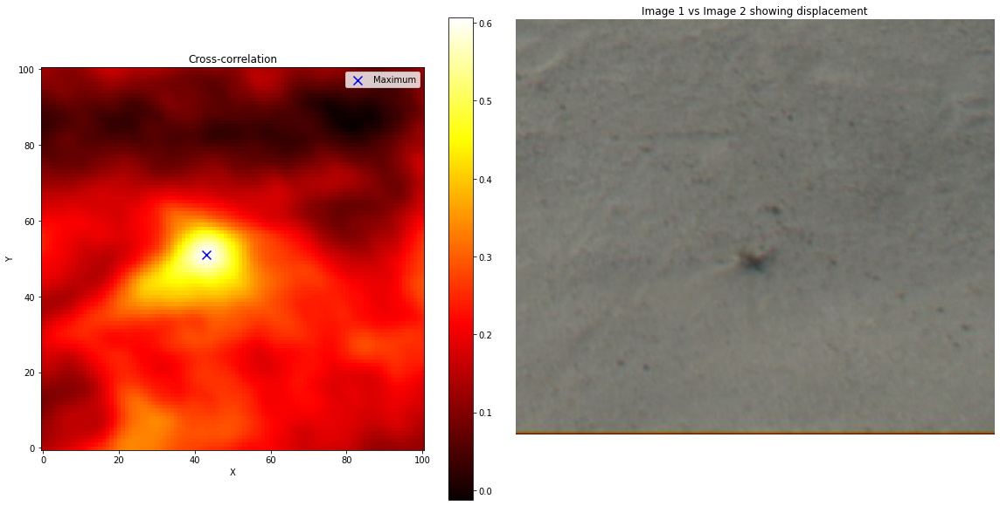

dx: 1.0, dy: -7.0
Displacement: 7.0710678118654755
Calculating displacement between 2024-05-01 09:30:00 and 2024-06-07 09:30:00


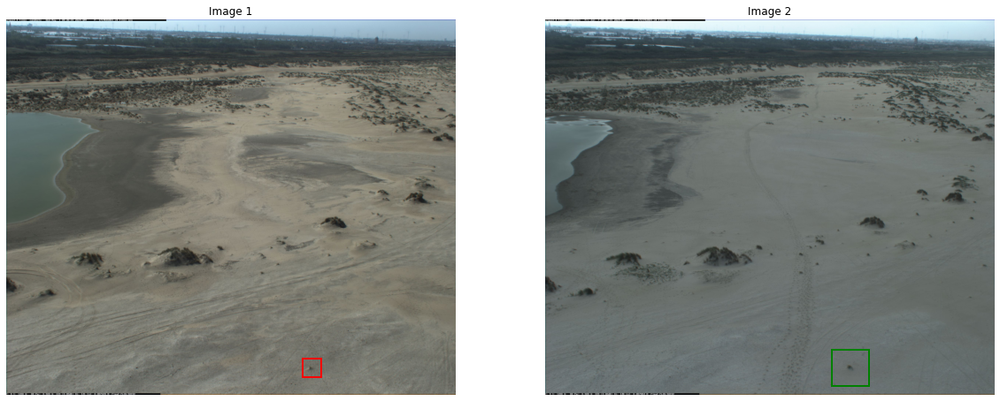

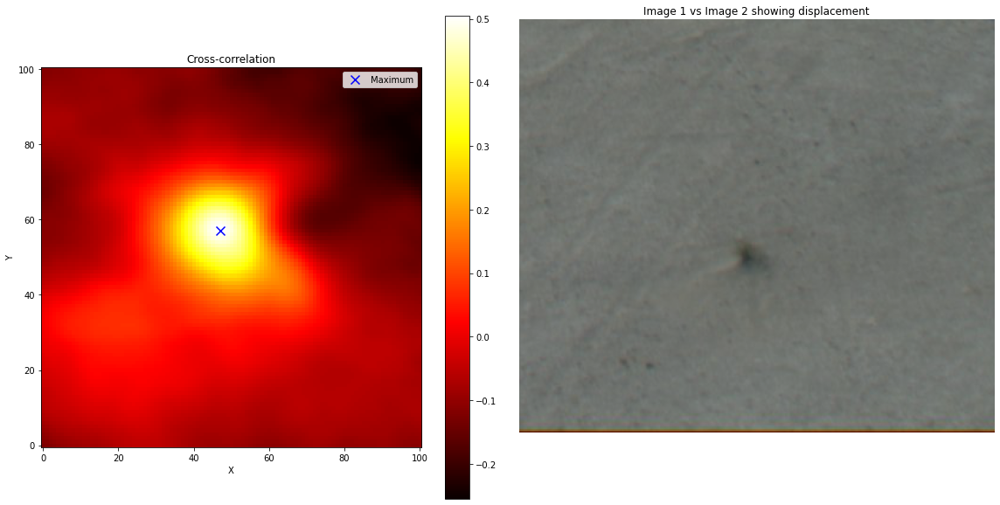

dx: 7.0, dy: -3.0
Displacement: 7.615773105863909
Calculating displacement between 2024-06-07 09:30:00 and 2024-07-17 09:30:00


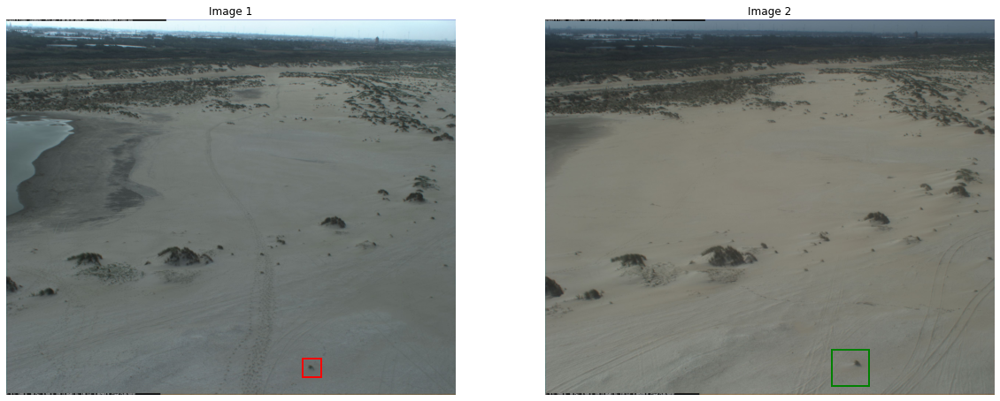

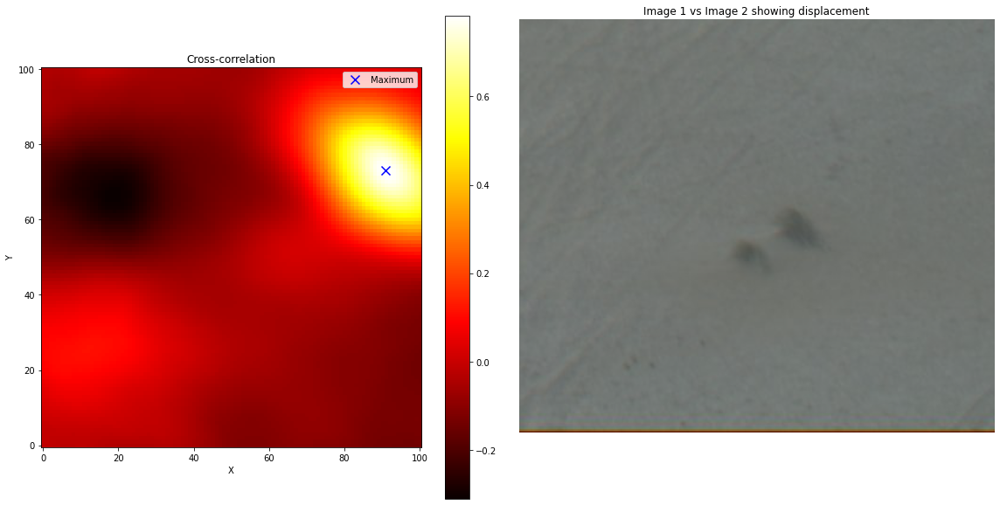

dx: 23.0, dy: 41.0
Displacement: 47.01063709417264
Calculating displacement between 2024-07-17 09:30:00 and 2024-10-09 09:30:00


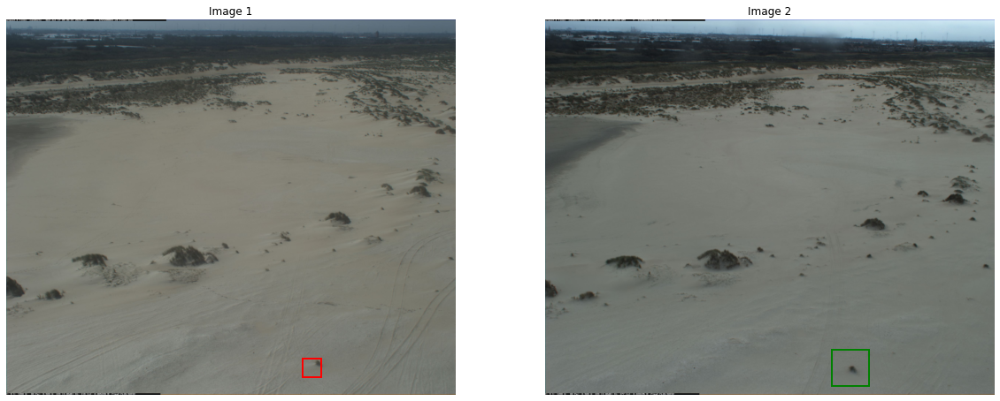

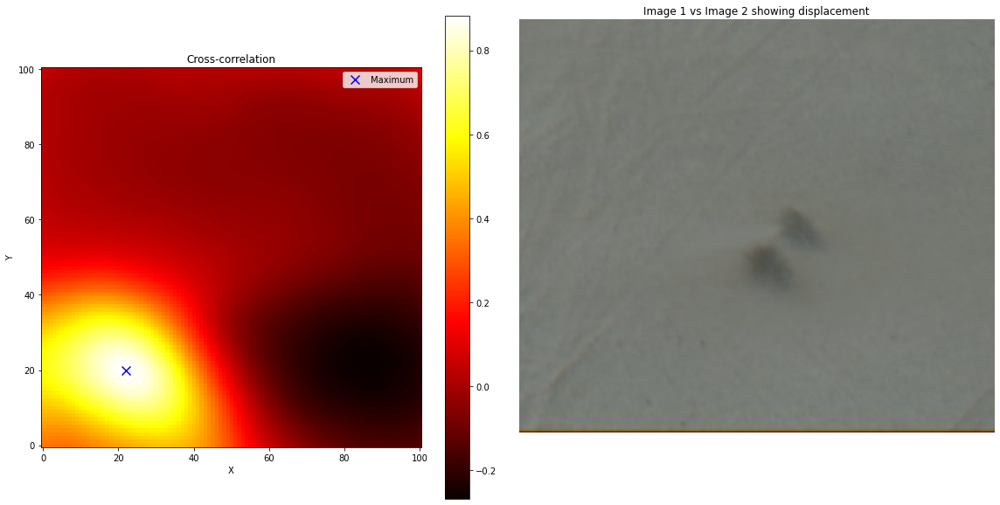

dx: -30.0, dy: -28.0
Displacement: 41.036569057366385


In [7]:
def compute_normalized_cross_correlation(patch1, patch2):
    
    """Compute the normalized cross correlation between two images""" 
        
    patch1_mean = np.mean(patch1)
    patch2_mean = np.mean(patch2)
    patch1_normalized = patch1 - patch1_mean
    patch2_normalized = patch2 - patch2_mean

    cross_correlation = np.sum(patch1_normalized * patch2_normalized)
    normalization_factor = np.sqrt(np.sum(patch1_normalized ** 2) * np.sum(patch2_normalized ** 2))
    
    return cross_correlation / normalization_factor

def calculate_displacement(image_path1, image_path2, x1_center, y1_center, n1=100, n2=200):
    
    """Calculates the displacement of a feature.""" 
    image1 = imread(image_path1)
    image2 = imread(image_path2)

    #Define a window in image 1 containing the feature to be tracked 
    x1_start, x1_end = x1_center - n1 // 2, x1_center + n1 // 2
    y1_start, y1_end = y1_center - n1 // 2, y1_center + n1 // 2
    patch1 = image1[x1_start:x1_end, y1_start:y1_end]

    #Define large window in image 2 centered at the same location
    x2_start, x2_end = x1_center - n2 // 2, x1_center + n2 // 2
    y2_start, y2_end = y1_center - n2 // 2, y1_center + n2 // 2
    patch2 = image2[x2_start:x2_end, y2_start:y2_end]


    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    ax1.imshow(image1, cmap='gray', vmin=0, vmax=500)
    ax1.set_title('Image 1')
    ax1.axis('off')
    ax1.add_patch(patches.Rectangle((y1_start, x1_start), n1, n1, linewidth=2, edgecolor='r', facecolor='none'))

    ax2.imshow(image2, cmap='gray', vmin=0, vmax=500)
    ax2.set_title('Image 2')
    ax2.axis('off')
    ax2.add_patch(patches.Rectangle((y2_start, x2_start), n2, n2, linewidth=2, edgecolor='g', facecolor='none'))

    plt.show()

    #compute cross-correlation over all possible locations
    cross_correlations = np.zeros((n2 - n1 + 1, n2 - n1 + 1))
    for i in range(n2 - n1 + 1):
        for j in range(n2 - n1 + 1):
            subset = patch2[i:i+n1, j:j+n1]
            cross_correlations[n2 - n1 - i, j] = compute_normalized_cross_correlation(patch1, subset)

    #locate maximum cross-correlation
    max_location = np.unravel_index(np.argmax(cross_correlations), cross_correlations.shape)
    dx = max_location[0] - (n2 / 2 - n1 / 2)
    dy = max_location[1] - (n2 / 2 - n1 / 2)
    displacement = np.sqrt(dx ** 2 + dy ** 2)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    #cross-correlation plot
    axes[0].imshow(cross_correlations, cmap='hot', origin='lower')
    im = axes[0].imshow(cross_correlations, cmap='hot', origin='lower')
    fig.colorbar(im, ax=axes[0])
    axes[0].scatter(max_location[1], max_location[0], color='blue', marker='x', s=100, label='Maximum')
    axes[0].legend()
    axes[0].set_title('Cross-correlation')
    axes[0].set_xlabel('X')
    axes[0].set_ylabel('Y')

    # Overlayed images
    axes[1].imshow(image1, cmap='gray', vmin=0, vmax=500)
    axes[1].imshow(image2, cmap='gray', vmin=0, vmax=500, alpha=0.5)
    axes[1].set_xlim(y2_start-100, y2_end+100)
    axes[1].set_ylim(x2_end+100, x2_start-100)
    axes[1].set_title('Image 1 vs Image 2 showing displacement')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
    
    #return displacement info
    print(f"dx: {dx}, dy: {dy}")
    print(f"Displacement: {displacement}")
    return dx, dy, displacement

#define the location of the smaller window
x1_center = 1900
y1_center = 1665

for i in range(1,5):
    image1_path = os.path.join(image_folder, image_files[i-1])
    image2_path = os.path.join(image_folder, image_files[i])
    
    print(f"Calculating displacement between {load_and_standardize(image1_path)[1]} and {load_and_standardize(image2_path)[1]}")
    calculate_displacement(image1_path, image2_path, x1_center, y1_center, n1=100, n2=200)

# Aligning the image using the displacement

If we now use the displacement calculated earlier and shift the second image to align with the first image and perform change detection again, the shrubs shouldn't be "moving". However what we found was that even though the center of the images are now aligned, the sides are not. You can see in the final change detection product that the shrub that we used for correlation does not show up as having moved, but the shrubs to the sides do.

Comparing 2024-06-07 09:30:00 with 2024-07-17 09:30:00 after alignment


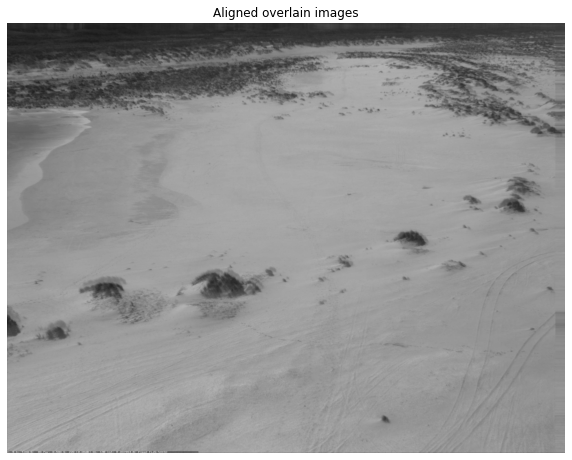

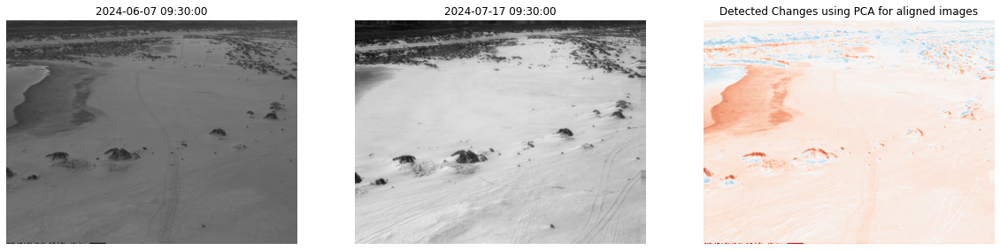

In [8]:
def align_image(image, dx, dy):
    """
    Aligns an image based on calculated dx and dy.
    Parameters:
        image (ndarray): The image to be shifted.
        dx (float): Vertical displacement.
        dy (float): Horizontal displacement.
    Returns:
        ndarray: The shifted (aligned) image.
    """
    aligned_image = shift(image, shift=[dx, dy], mode='nearest')
    return aligned_image

def change_detection_with_alignment(image1_path, image2_path, dx, dy):
    """ Applies PCA to the aligned images """

    img1, time1 = load_and_standardize(image1_path)[0:2]
    title1 = load_and_standardize(image1_path)[3]
    img2, time2 = load_and_standardize(image2_path)[0:2]
    title2 = load_and_standardize(image2_path)[3]
    
    img2_aligned = align_image(img2, dx, dy)

    pca_diff = apply_pca(img1, img2_aligned)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(img1, cmap='gray')
    plt.imshow(img2_aligned, cmap='gray',alpha=0.5)
    plt.title('Aligned overlain images')
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(20, 8))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img1, cmap='gray')
    plt.title(f"{title1}")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(img2_aligned, cmap='gray')
    plt.title(f"{title2}")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(pca_diff, cmap='RdBu') 
    plt.title('Detected Changes using PCA for aligned images')
    plt.axis('off')

    plt.show()

for i in range(3,4):
    image1_path = os.path.join(image_folder, image_files[i-1])
    image2_path = os.path.join(image_folder, image_files[i])

    dx, dy = 23,-41
    
    print(f"Comparing {load_and_standardize(image1_path)[3]} with {load_and_standardize(image2_path)[3]} after alignment")
    change_detection_with_alignment(image1_path, image2_path, dx, dy)